In [1]:
!pip install download

In [2]:

from __future__ import absolute_import,division,print_function,unicode_literals

import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import os
from datetime import datetime

import pandas as pd

from download import download

mpl.rcParams['figure.figsize'] = (8,6)
mpl.rcParams['axes.grid'] = False

print("Import Succesfull")

Import Succesfull


In [3]:
path = download('https://archive.ics.uci.edu/ml/machine-learning-databases/00501/PRSA2017_Data_20130301-20170228.zip','/tmp/aq', kind="zip")
     

Replace is False and data exists, so doing nothing. Use replace=True to re-download the data.


In [4]:
!dir C:\tmp\aq\PRSA_Data_20130301-20170228


 Volume in drive C is OS
 Volume Serial Number is 1E15-2921

 Directory of C:\tmp\aq\PRSA_Data_20130301-20170228

20-09-2024  00:34    <DIR>          .
20-09-2024  00:34    <DIR>          ..
20-09-2024  00:34         2,835,916 PRSA_Data_Aotizhongxin_20130301-20170228.csv
20-09-2024  00:34         2,722,295 PRSA_Data_Changping_20130301-20170228.csv
20-09-2024  00:34         2,675,856 PRSA_Data_Dingling_20130301-20170228.csv
20-09-2024  00:34         2,636,684 PRSA_Data_Dongsi_20130301-20170228.csv
20-09-2024  00:34         2,695,860 PRSA_Data_Guanyuan_20130301-20170228.csv
20-09-2024  00:34         2,654,625 PRSA_Data_Gucheng_20130301-20170228.csv
20-09-2024  00:34         2,641,027 PRSA_Data_Huairou_20130301-20170228.csv
20-09-2024  00:34         2,839,705 PRSA_Data_Nongzhanguan_20130301-20170228.csv
20-09-2024  00:34         2,620,654 PRSA_Data_Shunyi_20130301-20170228.csv
20-09-2024  00:34         2,655,061 PRSA_Data_Tiantan_20130301-20170228.csv
20-09-2024  00:34         2,659,544 P

In [5]:
df = pd.read_csv('/tmp/aq/PRSA_Data_20130301-20170228/PRSA_Data_Dingling_20130301-20170228.csv', encoding='ISO-8859-1')

In [6]:

df.info()
     

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34285 non-null  float64
 6   PM10     34408 non-null  float64
 7   SO2      34334 non-null  float64
 8   NO2      33830 non-null  float64
 9   CO       33052 non-null  float64
 10  O3       33850 non-null  float64
 11  TEMP     35011 non-null  float64
 12  PRES     35014 non-null  float64
 13  DEWP     35011 non-null  float64
 14  RAIN     35013 non-null  float64
 15  wd       34924 non-null  object 
 16  WSPM     35021 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB


In [7]:

def convert_to_date(x):
  return datetime.strptime(x, '%Y %m %d %H')

In [8]:


aq_df = pd.read_csv('/tmp/aq/PRSA_Data_20130301-20170228/PRSA_Data_Dingling_20130301-20170228.csv', parse_dates=[['year','month','day','hour']], date_parser=convert_to_date, keep_date_col=True)
aq_df.head(3)

C:\Users\thaku\AppData\Local\Temp\ipykernel_35832\2429787662.py:1: FutureWarning: The 'keep_date_col' keyword in pd.read_csv is deprecated and will be removed in a future version. Explicitly remove unwanted columns after parsing instead.
  aq_df = pd.read_csv('/tmp/aq/PRSA_Data_20130301-20170228/PRSA_Data_Dingling_20130301-20170228.csv', parse_dates=[['year','month','day','hour']], date_parser=convert_to_date, keep_date_col=True)
C:\Users\thaku\AppData\Local\Temp\ipykernel_35832\2429787662.py:1: FutureWarning: Support for nested sequences for 'parse_dates' in pd.read_csv is deprecated. Combine the desired columns with pd.to_datetime after parsing instead.
  aq_df = pd.read_csv('/tmp/aq/PRSA_Data_20130301-20170228/PRSA_Data_Dingling_20130301-20170228.csv', parse_dates=[['year','month','day','hour']], date_parser=convert_to_date, keep_date_col=True)
C:\Users\thaku\AppData\Local\Temp\ipykernel_35832\2429787662.py:1: FutureWarning: The argument 'date_parser' is deprecated and will be remov

,year_month_day_hour,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,2013-03-01 00:00:00,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
1,2013-03-01 01:00:00,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2,2013-03-01 02:00:00,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling


In [9]:

aq_df['month'] =  pd.to_numeric(aq_df['month'])

In [10]:

print("Rows     :", aq_df.shape[0])
print("Columns  :", aq_df.shape[1])
print("\n Features \n", aq_df.columns.to_list())
print("\n Missing Values \n", aq_df.isnull().any())
print("\n Unique Values \n", aq_df.nunique())

Rows     : 35064
Columns  : 19

 Features 
 ['year_month_day_hour', 'No', 'year', 'month', 'day', 'hour', 'PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'wd', 'WSPM', 'station']

 Missing Values 
 year_month_day_hour    False
No                     False
year                   False
month                  False
day                    False
hour                   False
PM2.5                   True
PM10                    True
SO2                     True
NO2                     True
CO                      True
O3                      True
TEMP                    True
PRES                    True
DEWP                    True
RAIN                    True
wd                      True
WSPM                    True
station                False
dtype: bool

 Unique Values 
 year_month_day_hour    35064
No                     35064
year                       5
month                     12
day                       31
hour                      24
PM2.5               

In [11]:
aq_df.describe()

,year_month_day_hour,No,month,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064,35064.000000,35064.000000,34285.000000,34408.000000,34334.000000,33830.000000,33052.000000,33850.000000,35011.000000,35014.000000,35011.000000,35013.000000,35021.000000
mean,2015-03-01 11:30:00,17532.500000,6.522930,65.989497,83.739723,11.749650,27.585467,904.896073,68.548371,13.686111,1007.760278,1.505495,0.060366,1.853836
min,2013-03-01 00:00:00,1.000000,1.000000,3.000000,2.000000,0.285600,1.026500,100.000000,0.214200,-16.600000,982.400000,-35.100000,0.000000,0.000000
25%,2014-03-01 05:45:00,8766.750000,4.000000,14.000000,26.000000,2.000000,9.000000,300.000000,31.000000,3.400000,999.300000,-10.200000,0.000000,1.000000
50%,2015-03-01 11:30:00,17532.500000,7.000000,41.000000,60.000000,5.000000,19.000000,600.000000,61.000000,14.700000,1007.400000,1.800000,0.000000,1.500000
75%,2016-02-29 17:15:00,26298.250000,10.000000,93.000000,117.000000,15.000000,38.000000,1200.000000,90.000000,23.300000,1016.000000,14.200000,0.000000,2.300000
max,2017-02-28 23:00:00,35064.000000,12.000000,881.000000,905.000000,156.000000,205.000000,10000.000000,500.000000,41.400000,1036.500000,27.200000,52.100000,10.000000
std,NaN,10122.249256,3.448752,72.267723,79.541685,15.519259,26.383882,903.306220,53.764424,11.365313,10.225664,13.822099,0.752899,1.309808


In [12]:

aq_df_non_indexed = aq_df.copy()

In [13]:
aq_df = aq_df.set_index('year_month_day_hour')

In [14]:

aq_df.index
     

DatetimeIndex(['2013-03-01 00:00:00', '2013-03-01 01:00:00',
               '2013-03-01 02:00:00', '2013-03-01 03:00:00',
               '2013-03-01 04:00:00', '2013-03-01 05:00:00',
               '2013-03-01 06:00:00', '2013-03-01 07:00:00',
               '2013-03-01 08:00:00', '2013-03-01 09:00:00',
               ...
               '2017-02-28 14:00:00', '2017-02-28 15:00:00',
               '2017-02-28 16:00:00', '2017-02-28 17:00:00',
               '2017-02-28 18:00:00', '2017-02-28 19:00:00',
               '2017-02-28 20:00:00', '2017-02-28 21:00:00',
               '2017-02-28 22:00:00', '2017-02-28 23:00:00'],
              dtype='datetime64[ns]', name='year_month_day_hour', length=35064, freq=None)

In [15]:

aq_df.loc['2013-03-01':'2013-03-05']
     

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
year_month_day_hour,,,,,,,,,,,,,,,,,,
2013-03-01 00:00:00,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
2013-03-01 01:00:00,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2013-03-01 02:00:00,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
2013-03-01 03:00:00,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
2013-03-01 04:00:00,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2013-03-05 19:00:00,116,2013,3,5,19,179.0,200.0,50.0,96.0,1600.0,82.0,7.7,1005.4,-7.6,0.0,NNE,0.2,Dingling
2013-03-05 20:00:00,117,2013,3,5,20,172.0,180.0,43.0,94.0,1899.0,82.0,6.3,1005.9,-7.3,0.0,NNE,0.7,Dingling
2013-03-05 21:00:00,118,2013,3,5,21,179.0,191.0,38.0,80.0,1700.0,82.0,5.6,1006.0,-7.3,0.0,NNE,0.2,Dingling


In [16]:

aq_df.loc['2013':'2015']

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
year_month_day_hour,,,,,,,,,,,,,,,,,,
2013-03-01 00:00:00,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
2013-03-01 01:00:00,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2013-03-01 02:00:00,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
2013-03-01 03:00:00,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
2013-03-01 04:00:00,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-12-31 19:00:00,24860,2015,12,31,19,85.0,95.0,12.0,73.0,1200.0,2.0,-0.6,1021.0,-9.5,0.0,NE,0.6,Dingling
2015-12-31 20:00:00,24861,2015,12,31,20,NaN,109.0,32.0,79.0,2900.0,2.0,-1.8,1021.2,-9.9,0.0,NW,1.1,Dingling
2015-12-31 21:00:00,24862,2015,12,31,21,80.0,100.0,35.0,81.0,3200.0,2.0,-1.6,1020.8,-9.7,0.0,NE,0.9,Dingling


In [17]:

pm_data = aq_df['PM2.5']
pm_data.head(2)

year_month_day_hour
2013-03-01 00:00:00    4.0
2013-03-01 01:00:00    7.0
Name: PM2.5, dtype: float64

<Axes: xlabel='year_month_day_hour'>

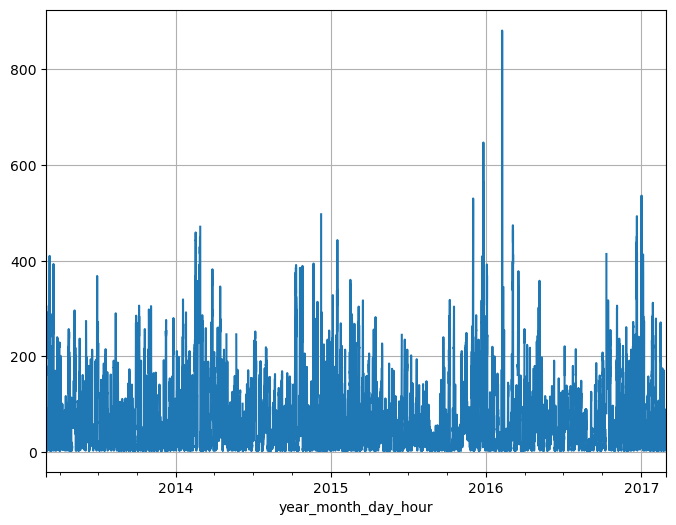

In [18]:

pm_data.plot(grid = True)

<Axes: xlabel='year_month_day_hour'>

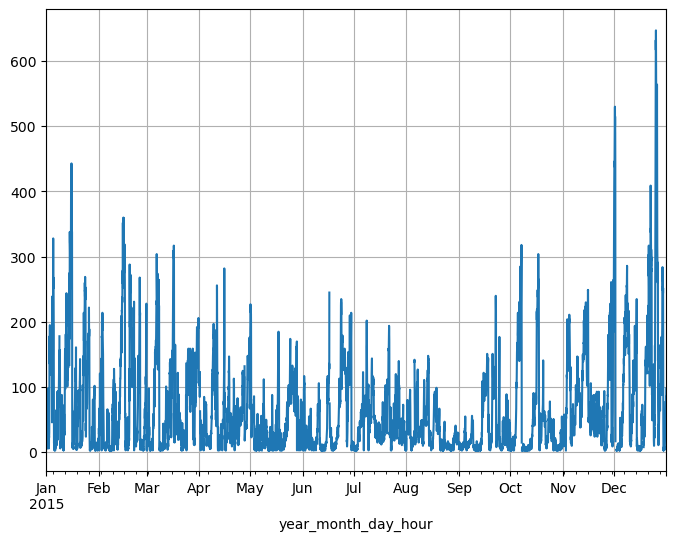

In [19]:

aq_df_2015 = aq_df.loc['2015']
pm_data_2015 = aq_df_2015['PM2.5']
pm_data_2015.plot(grid = True)

<Axes: xlabel='year_month_day_hour'>

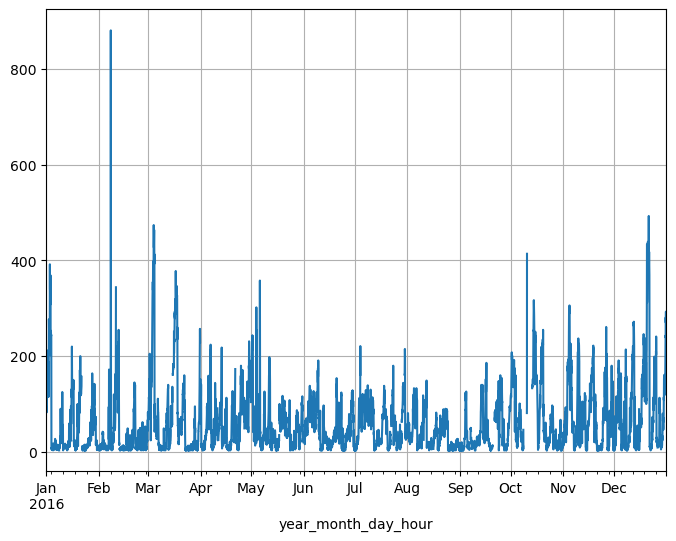

In [20]:

aq_df_2016 = aq_df.loc['2016']
pm_data_2016 = aq_df_2016['PM2.5']
pm_data_2016.plot(grid = True)
     

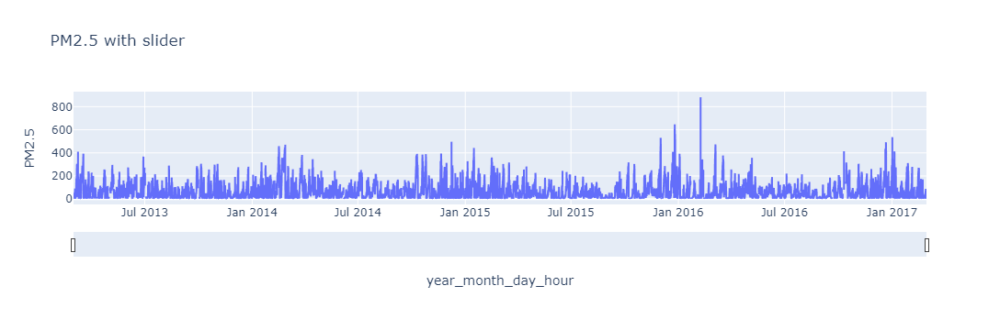

In [21]:

import plotly.express as px
fig = px.line(aq_df_non_indexed, x = 'year_month_day_hour',y = 'PM2.5',title = 'PM2.5 with slider')

fig.update_xaxes(
    rangeslider_visible= True  
                
                   )
fig.show()

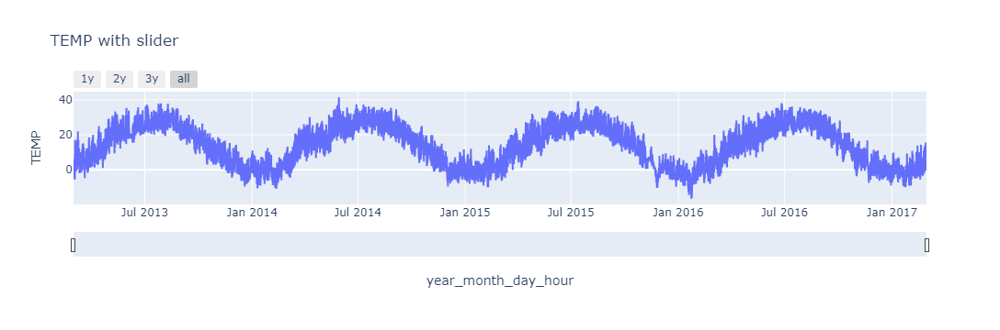

In [22]:

fig = px.line(aq_df_non_indexed, x = 'year_month_day_hour',y = 'TEMP',title = 'TEMP with slider')

fig.update_xaxes(
    rangeslider_visible= True,
    rangeselector=dict(
                        buttons = list([
                        dict(count = 1,label = '1y',step='year',stepmode = "backward"),
                        dict(count = 2,label = '2y',step='year',stepmode = "backward"),
                        dict(count = 3,label = '3y',step='year',stepmode = "backward"),
                        dict(step= 'all')
                            ])        
                        )
                   )
fig.show()
     

Text(0.5, 1.0, 'Air qulaity 2014 and 2015')

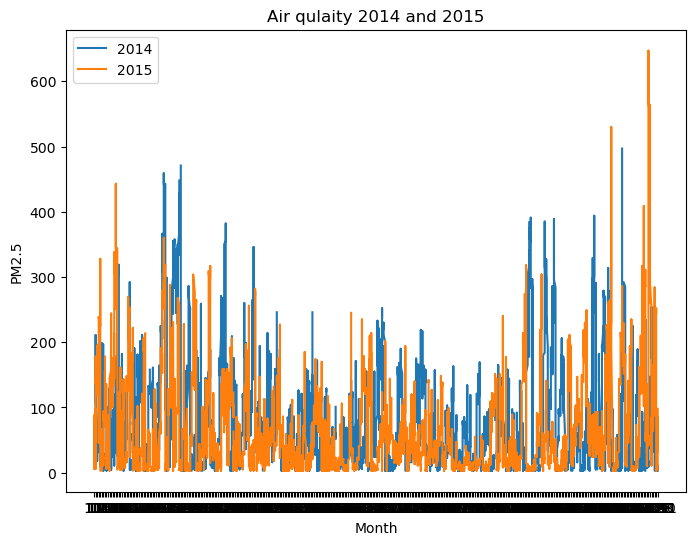

In [23]:

df_2014 = aq_df.loc['2014'].reset_index()
df_2015 = aq_df.loc['2015'].reset_index()

df_2014['month_day_hour'] = df_2014.apply(lambda x : str(x['month'])+"."+x['day'],axis = 1)
df_2015['month_day_hour'] = df_2015.apply(lambda x : str(x['month'])+"."+x['day'],axis = 1)

plt.plot(df_2014['month_day_hour'],df_2014['PM2.5'])
plt.plot(df_2015['month_day_hour'],df_2015['PM2.5'])

plt.legend(['2014','2015'])
plt.xlabel('Month')
plt.ylabel('PM2.5')

plt.title('Air qulaity 2014 and 2015')

In [24]:

df_2014['month_day_hour']

0         1.1
1         1.1
2         1.1
3         1.1
4         1.1
        ...  
8755    12.31
8756    12.31
8757    12.31
8758    12.31
8759    12.31
Name: month_day_hour, Length: 8760, dtype: object

In [25]:

aq_df['2014':'2016'][['month','PM2.5']].groupby('month').describe()

PM2.5                                                       
        count       mean         std  min   25%   50%     75%    max
month                                                               
1      2173.0  70.285274   75.913587  3.0  12.0  38.0  113.00  443.0
2      1978.0  86.389282  105.603069  3.0  10.0  33.0  132.00  881.0
3      2212.0  80.193852   87.889440  3.0  13.0  47.0  123.25  474.0
4      2105.0  67.963325   56.430235  3.0  25.0  54.0   95.00  346.0
5      2188.0  47.994378   44.843130  3.0  16.0  35.0   67.00  358.0
6      2119.0  46.655403   43.877349  3.0  13.0  31.0   69.00  245.0
7      2205.0  61.671474   50.926149  3.0  21.0  48.0   91.00  252.0
8      2206.0  41.364869   37.279312  3.0  13.0  29.0   60.00  217.0
9      2074.0  45.356123   43.235331  3.0  11.0  27.0   78.00  240.0
10     2081.0  82.586257   92.234361  3.0  13.0  43.0  124.00  414.0
11     2141.0  77.500140   71.720648  3.0  20.0  56.0  112.00  394.0
12     2186.0  87.990851  104.677021  3.0  11.0  48.5  135.00  647.0

In [26]:

aq_df['2014':'2016'][['month','PM2.5','TEMP']].groupby('month').agg({'PM2.5':['min','max'],'TEMP':['min','max']})

PM2.5         TEMP      
        min    max   min   max
month                         
1       3.0  443.0 -16.6  12.4
2       3.0  881.0 -10.9  14.0
3       3.0  474.0  -6.4  26.0
4       3.0  346.0   1.3  32.0
5       3.0  358.0   7.0  41.4
6       3.0  245.0  15.1  38.1
7       3.0  252.0  16.8  39.2
8       3.0  217.0  16.6  36.3
9       3.0  240.0   7.8  34.5
10      3.0  414.0  -1.4  28.1
11      3.0  394.0 -10.3  20.8
12      3.0  647.0  -9.7  11.6

array([<Axes: xlabel='year_month_day_hour'>,
       <Axes: xlabel='year_month_day_hour'>], dtype=object)

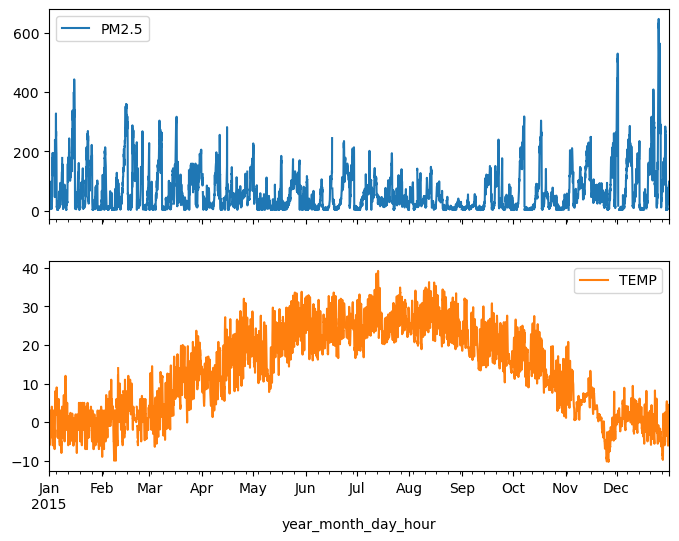

In [27]:

aq_df_2015 = aq_df.loc['2015']
pm_data_2015 = aq_df_2015[['PM2.5','TEMP']]
pm_data_2015.plot(subplots = True)

array([[<Axes: title={'center': 'PM2.5'}>,
        <Axes: title={'center': 'TEMP'}>]], dtype=object)

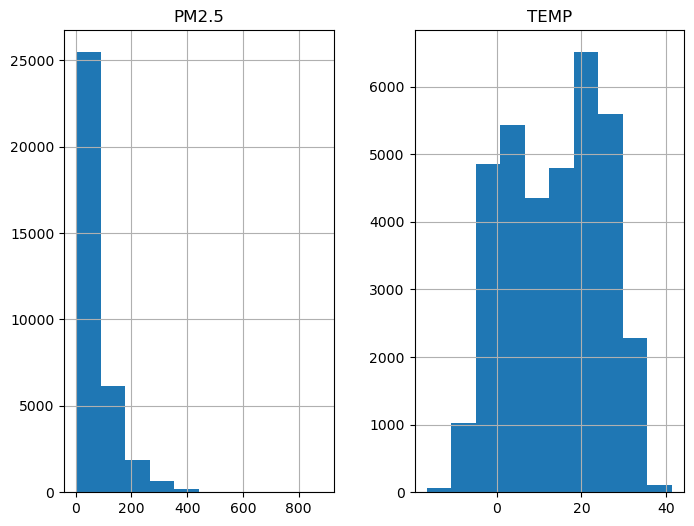

In [28]:

aq_df[['PM2.5','TEMP']].hist()
#bimodal distribution

<Axes: ylabel='Density'>

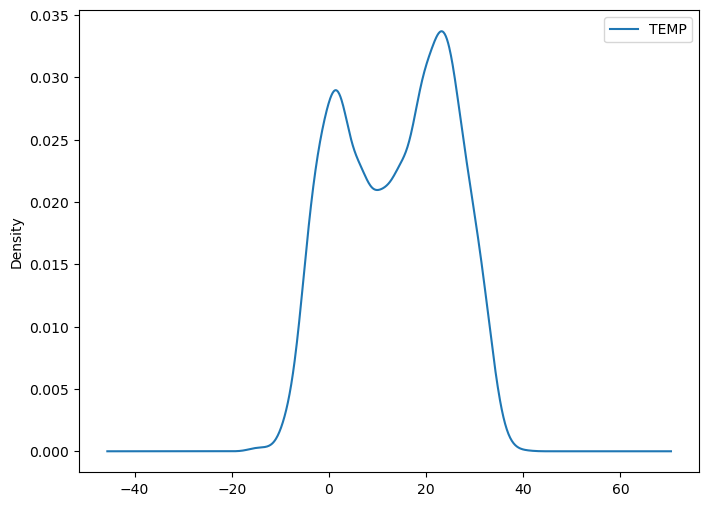

In [29]:

aq_df[['TEMP']].plot(kind = 'density')

<Axes: xlabel='y(t)', ylabel='y(t + 1)'>

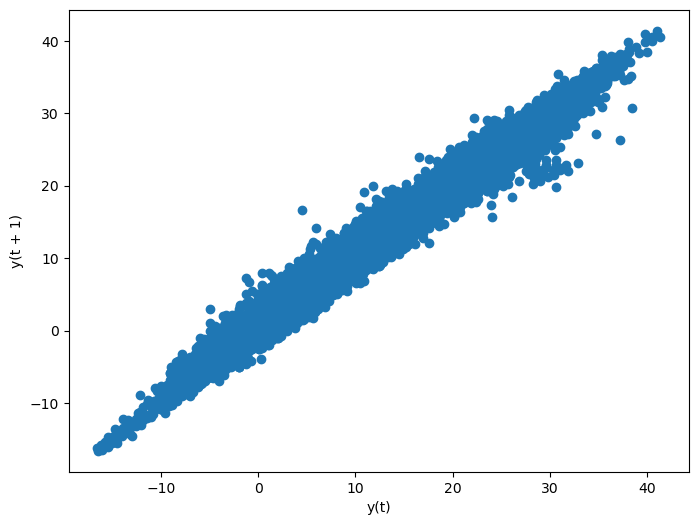

In [30]:
# strong corelation is shown in between the current and the previous hour 
# thats why strainght line with very less varieance
pd.plotting.lag_plot(aq_df['TEMP'],lag =1)

<Axes: xlabel='y(t)', ylabel='y(t + 10)'>

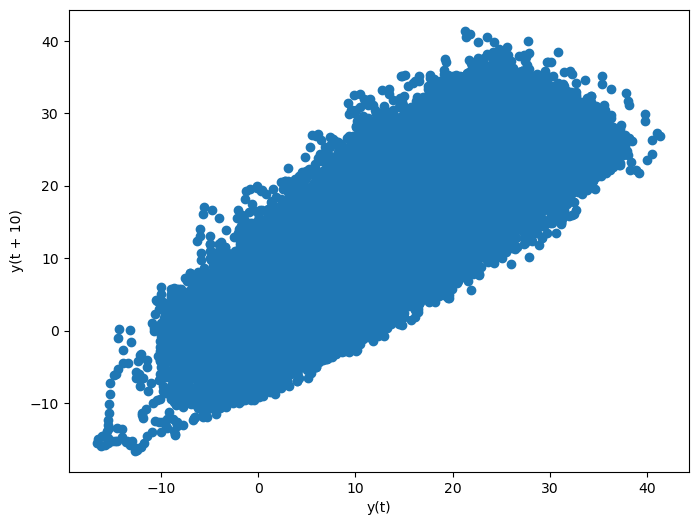

In [31]:

pd.plotting.lag_plot(aq_df['TEMP'],lag =10)
     

<Axes: xlabel='y(t)', ylabel='y(t + 24)'>

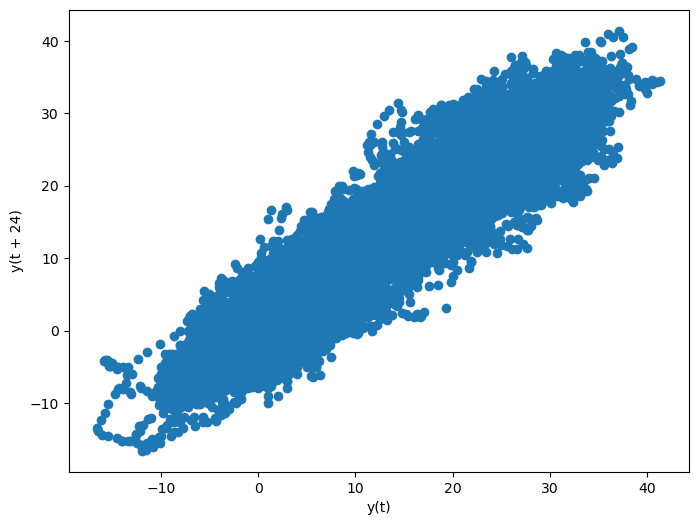

In [32]:

pd.plotting.lag_plot(aq_df['TEMP'],lag =24)

<Axes: xlabel='y(t)', ylabel='y(t + 8640)'>

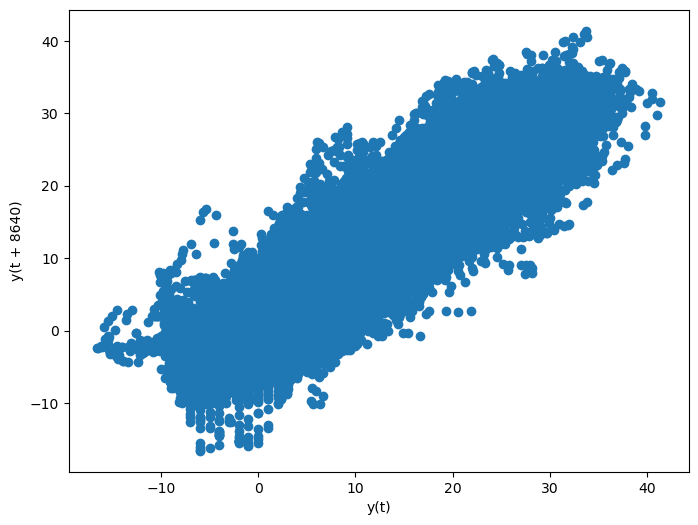

In [33]:
# as days are increasing there is still high corelation
# BUT THIS IS not as HIgh as earlier since the widh / varience from the straight line is more 
# 8640 means current house is being compared to 1 hour in the prev year
pd.plotting.lag_plot(aq_df['TEMP'],lag =8640)

<Axes: xlabel='y(t)', ylabel='y(t + 2150)'>

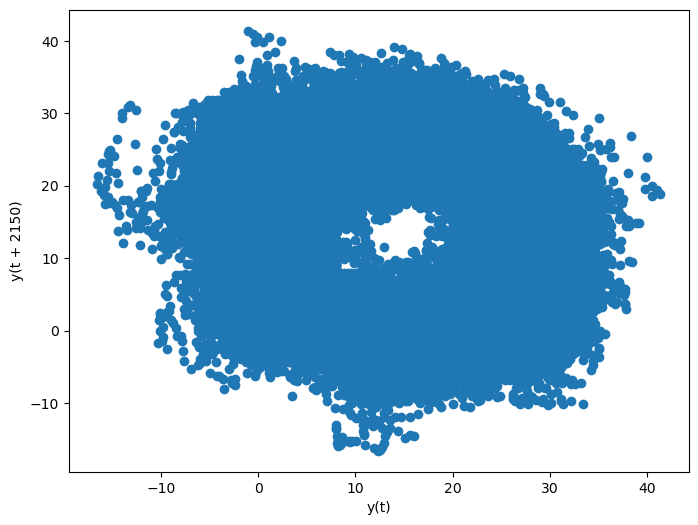

In [34]:
# since in 6 months there is lot of varience in the temp

pd.plotting.lag_plot(aq_df['TEMP'],lag =2150) #no correlation

array([<Axes: xlabel='year_month_day_hour'>,
       <Axes: xlabel='year_month_day_hour'>,
       <Axes: xlabel='year_month_day_hour'>], dtype=object)

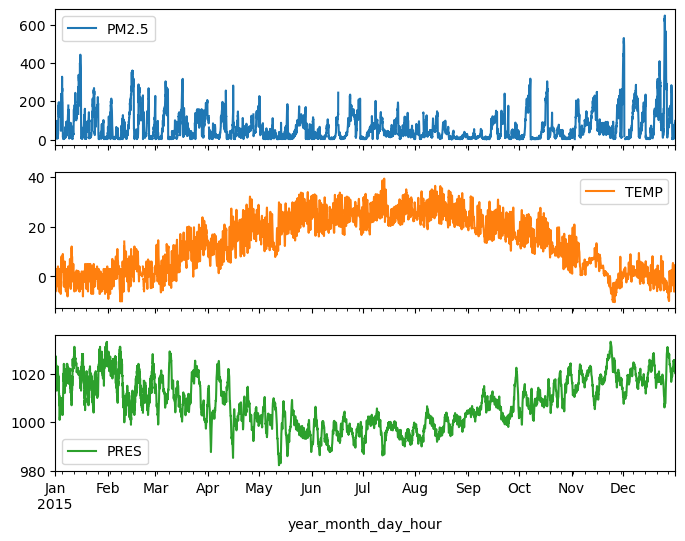

In [35]:
aq_df_2015 = aq_df.loc['2015']
pm_data_2015 = aq_df_2015[['PM2.5','TEMP','PRES']]
pm_data_2015.plot(subplots = True)

In [36]:
### temp and pressure have negative corerelation

array([<Axes: xlabel='year_month_day_hour'>,
       <Axes: xlabel='year_month_day_hour'>,
       <Axes: xlabel='year_month_day_hour'>,
       <Axes: xlabel='year_month_day_hour'>,
       <Axes: xlabel='year_month_day_hour'>], dtype=object)

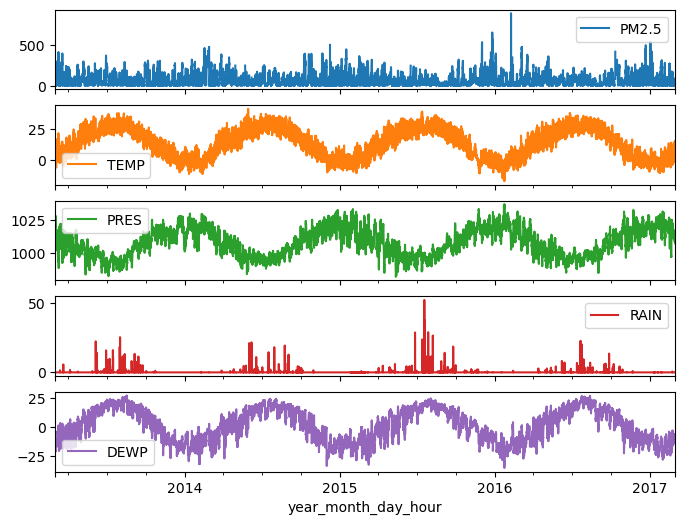

In [37]:
multi_data = aq_df[['PM2.5','TEMP','PRES','RAIN','DEWP']]
multi_data.plot(subplots = True)

array([<Axes: xlabel='year_month_day_hour'>,
       <Axes: xlabel='year_month_day_hour'>,
       <Axes: xlabel='year_month_day_hour'>,
       <Axes: xlabel='year_month_day_hour'>,
       <Axes: xlabel='year_month_day_hour'>], dtype=object)

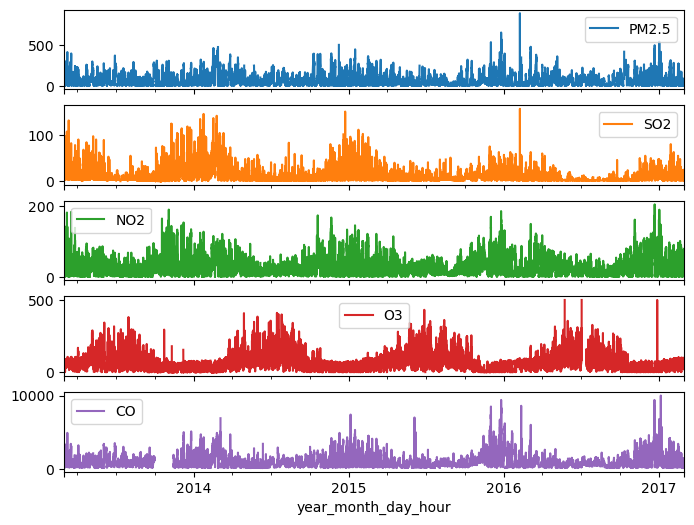

In [38]:

multi_data = aq_df[['PM2.5','SO2','NO2','O3','CO']]
multi_data.plot(subplots = True)
     


Text(0.5, 0, 'year_month_day_hour')

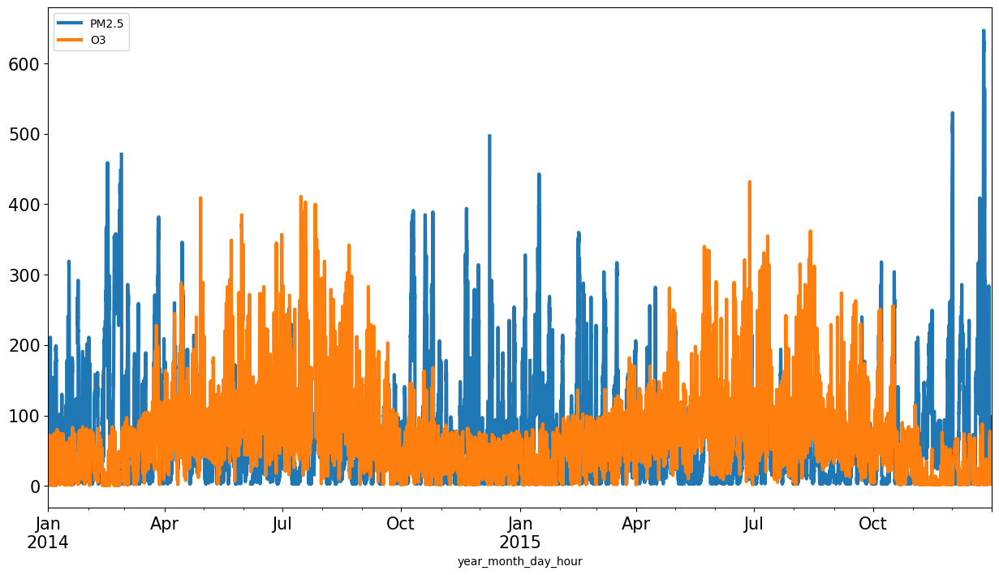

In [39]:

aq_df['2014':'2015'][['PM2.5','O3']].plot(figsize=(15,8),linewidth= 3,fontsize = 15)
plt.xlabel('year_month_day_hour')

In [40]:
## where one highother low

In [41]:
aq_df.isnull().any()

No         False
year       False
month      False
day        False
hour       False
PM2.5       True
PM10        True
SO2         True
NO2         True
CO          True
O3          True
TEMP        True
PRES        True
DEWP        True
RAIN        True
wd          True
WSPM        True
station    False
dtype: bool

In [42]:

aq_df.isnull().sum()
     

No            0
year          0
month         0
day           0
hour          0
PM2.5       779
PM10        656
SO2         730
NO2        1234
CO         2012
O3         1214
TEMP         53
PRES         50
DEWP         53
RAIN         51
wd          140
WSPM         43
station       0
dtype: int64

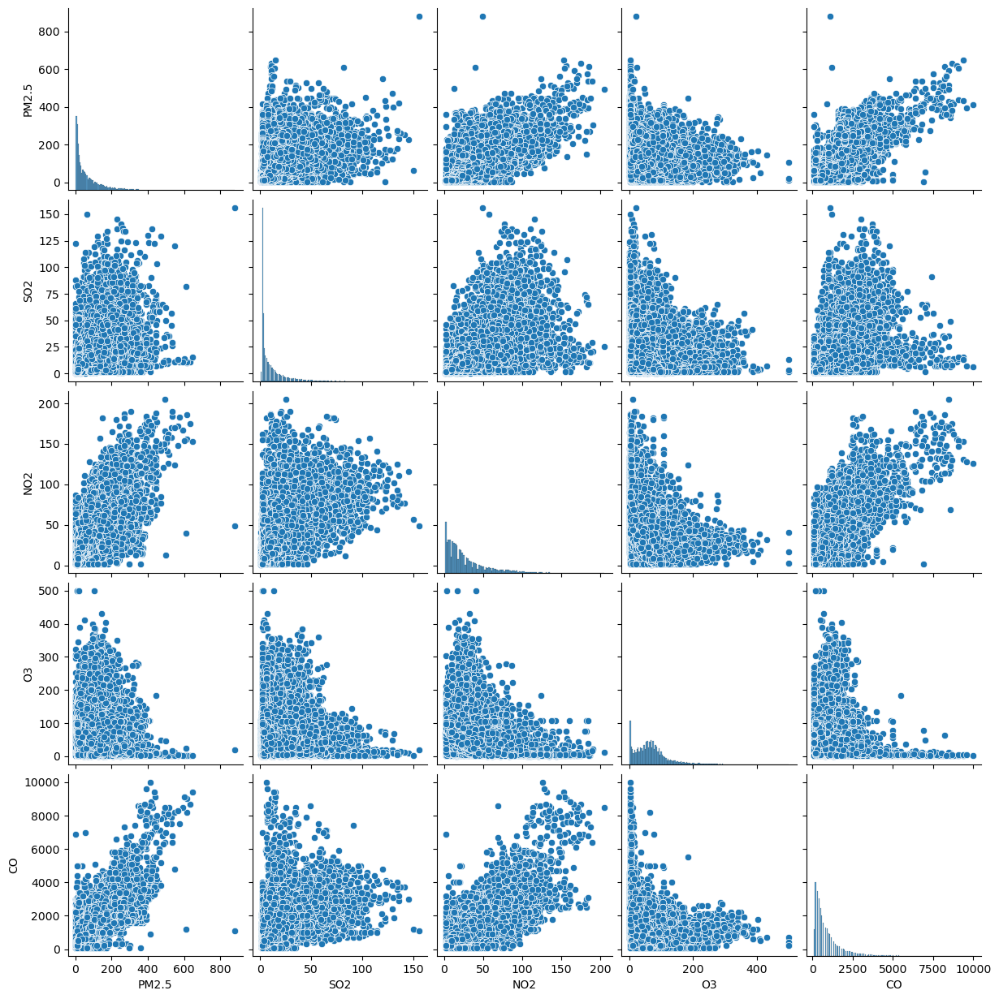

In [43]:

g = sns.pairplot(aq_df[['PM2.5','SO2','NO2','O3','CO']])

In [44]:

aq_corr = aq_df[['PM2.5','SO2','NO2','O3','CO']].corr(method = 'pearson')
aq_corr

,PM2.5,SO2,NO2,O3,CO
PM2.5,1.000000,0.475117,0.718170,-0.100542,0.802737
SO2,0.475117,1.000000,0.610433,-0.182096,0.529182
NO2,0.718170,0.610433,1.000000,-0.373625,0.798753
O3,-0.100542,-0.182096,-0.373625,1.000000,-0.303275
CO,0.802737,0.529182,0.798753,-0.303275,1.000000


<Axes: >

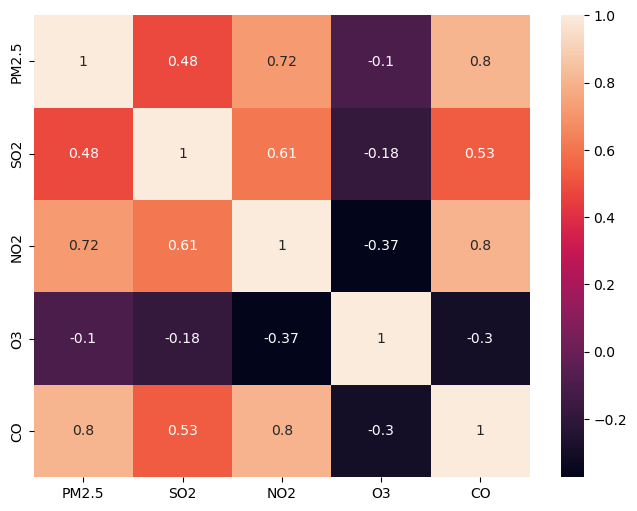

In [45]:

sns.heatmap(aq_corr,annot=True)


In [46]:

aq_df.groupby('wd').agg(median=('PM2.5','median'),mean=('PM2.5','mean'),max=('PM2.5','max'),min=('PM2.5','min')).reset_index()


aq_df[['wd','PM2.5','TEMP']].groupby('wd').agg({'PM2.5': ['mean','min','max']})

PM2.5            
          mean  min    max
wd                        
E    88.623363  3.0  434.0
ENE  77.685514  3.0  647.0
ESE  96.492276  3.0  632.0
N    57.546221  3.0  536.0
NE   57.390083  3.0  530.0
NNE  53.946239  3.0  881.0
NNW  62.790775  3.0  548.0
NW   52.769116  3.0  535.0
S    72.497281  3.0  511.0
SE   85.045709  3.0  617.0
SSE  79.925967  3.0  614.0
SSW  73.078253  3.0  493.0
SW   70.233140  3.0  459.0
W    49.488104  3.0  446.0
WNW  37.307447  3.0  515.0
WSW  66.725926  3.0  451.0

In [47]:

aq_df_na = aq_df.copy()
aq_df_na = aq_df_na.dropna()
## drop na only for vis otherwise not good strategy

In [48]:
aq_df_na.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
year_month_day_hour,,,,,,,,,,,,,,,,,,
2013-03-01 02:00:00,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
2013-03-01 05:00:00,6,2013,3,1,5,6.0,6.0,3.0,4.0,200.0,79.0,-4.5,1022.6,-19.5,0.0,NNW,1.7,Dingling
2013-03-01 06:00:00,7,2013,3,1,6,5.0,10.0,3.0,4.0,200.0,77.0,-4.5,1023.4,-19.5,0.0,NNW,1.8,Dingling
2013-03-01 07:00:00,8,2013,3,1,7,5.0,6.0,3.0,2.0,200.0,80.0,-2.1,1024.6,-20.0,0.0,NW,2.5,Dingling
2013-03-01 08:00:00,9,2013,3,1,8,8.0,7.0,3.0,3.0,200.0,79.0,-0.2,1025.2,-20.5,0.0,NNW,2.8,Dingling


<Axes: xlabel='Lag', ylabel='Autocorrelation'>

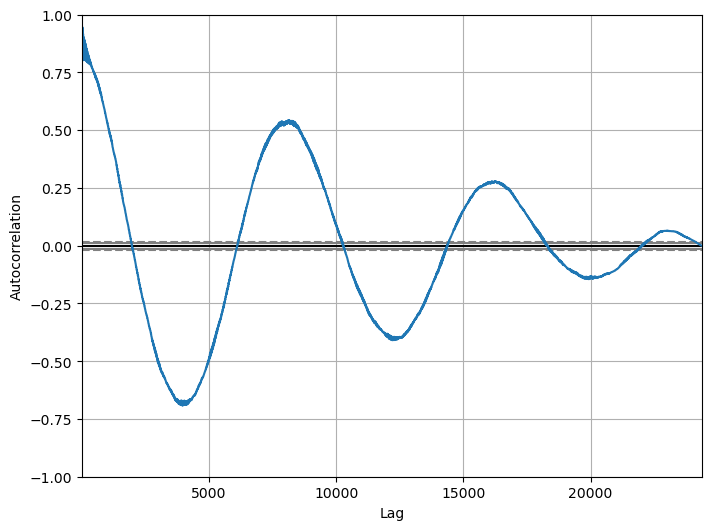

In [49]:
pd.plotting.autocorrelation_plot(aq_df_na.loc['2014':'2016']['TEMP'])
# data is in hours

In [50]:
# After almost 8500 hourse we see that correlattion is again high , since in a year seasonal cycles
# corelation to t+1 hour after t hour is highly positibe , almost 3500 is highly -ve since opposite season

In [51]:
aq_df_na['TEMP'].resample('1M').mean()
# aggregates data to per month

C:\Users\thaku\AppData\Local\Temp\ipykernel_35832\3283542932.py:1: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



year_month_day_hour
2013-03-31     6.039970
2013-04-30    12.208494
2013-05-31    21.886386
2013-06-30    23.752827
2013-07-31    27.405079
2013-08-31    27.228465
2013-09-30    20.482500
2013-10-31          NaN
2013-11-30     5.434524
2013-12-31     0.896623
2014-01-31     0.023428
2014-02-28    -0.352762
2014-03-31    10.415449
2014-04-30    17.235362
2014-05-31    22.043236
2014-06-30    25.194985
2014-07-31    28.409502
2014-08-31    26.284552
2014-09-30    20.834161
2014-10-31    13.556000
2014-11-30     6.357762
2014-12-31    -0.745582
2015-01-31    -0.590377
2015-02-28     1.572512
2015-03-31     8.707613
2015-04-30    15.566570
2015-05-31    21.300275
2015-06-30    24.636691
2015-07-31    26.228630
2015-08-31    26.135854
2015-09-30    20.392206
2015-10-31    14.387465
2015-11-30     3.358686
2015-12-31    -0.053912
2016-01-31    -4.233428
2016-02-29     1.434441
2016-03-31     8.687006
2016-04-30    16.262014
2016-05-31    20.793142
2016-06-30    25.481977
2016-07-31    25.839

C:\Users\thaku\AppData\Local\Temp\ipykernel_35832\3697276874.py:1: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



<Axes: xlabel='Lag', ylabel='Autocorrelation'>

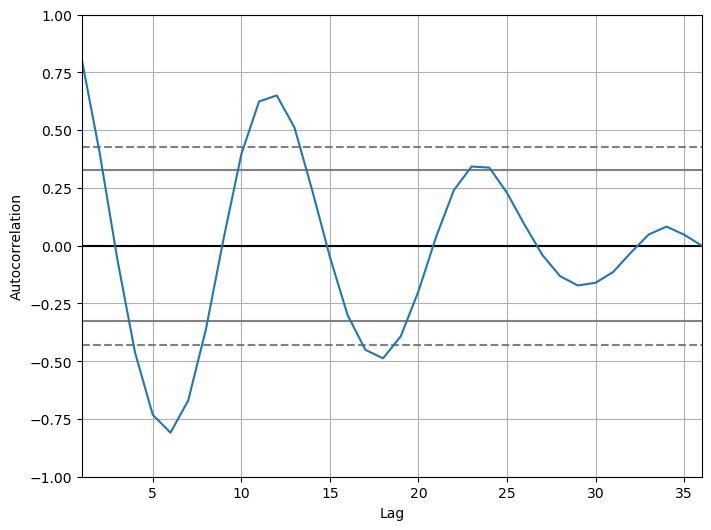

In [52]:
pd.plotting.autocorrelation_plot(aq_df_na.loc['2014':'2016']['TEMP'].resample('1M').mean())
# PLAIN line 90 percent 
# dotte dline 95 percent confidence interval

C:\Users\thaku\AppData\Local\Temp\ipykernel_35832\3261844836.py:1: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



<Axes: xlabel='Lag', ylabel='Autocorrelation'>

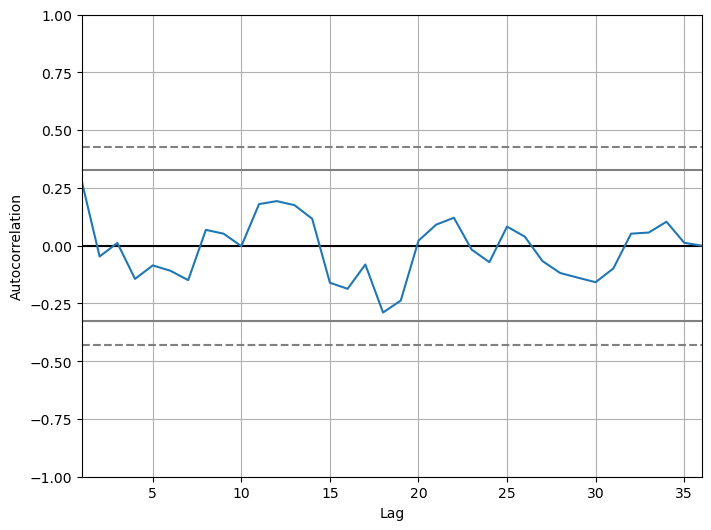

In [53]:
pd.plotting.autocorrelation_plot(aq_df_na.loc['2014':'2016']['PM2.5'].resample('1M').mean())

In [54]:
# here the  conficence interval is not crossed so here we are haivng some corr but it is not excelling 95 percent ci

### treating missing info

In [55]:
# cannot simply take median

In [56]:


aq_df = pd.read_csv('/tmp/aq/PRSA_Data_20130301-20170228/PRSA_Data_Dingling_20130301-20170228.csv', parse_dates=[['year','month','day','hour']], date_parser=convert_to_date, keep_date_col=True)
aq_df.head(3)

C:\Users\thaku\AppData\Local\Temp\ipykernel_35832\2429787662.py:1: FutureWarning:

The 'keep_date_col' keyword in pd.read_csv is deprecated and will be removed in a future version. Explicitly remove unwanted columns after parsing instead.

C:\Users\thaku\AppData\Local\Temp\ipykernel_35832\2429787662.py:1: FutureWarning:

Support for nested sequences for 'parse_dates' in pd.read_csv is deprecated. Combine the desired columns with pd.to_datetime after parsing instead.

C:\Users\thaku\AppData\Local\Temp\ipykernel_35832\2429787662.py:1: FutureWarning:

The argument 'date_parser' is deprecated and will be removed in a future version. Please use 'date_format' instead, or read your data in as 'object' dtype and then call 'to_datetime'.



,year_month_day_hour,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,2013-03-01 00:00:00,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
1,2013-03-01 01:00:00,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2,2013-03-01 02:00:00,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling


In [57]:
aq_df.loc[aq_df['TEMP'].isnull()]

,year_month_day_hour,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
16748,2015-01-27 20:00:00,16749,2015,1,27,20,39.0,43.0,28.0,34.0,1100.0,23.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
16813,2015-01-30 13:00:00,16814,2015,1,30,13,15.0,19.0,19.0,5.0,400.0,68.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
16829,2015-01-31 05:00:00,16830,2015,1,31,5,5.0,11.0,32.0,8.0,400.0,60.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
16873,2015-02-02 01:00:00,16874,2015,2,2,1,60.0,60.0,30.0,39.0,2600.0,9.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
16883,2015-02-02 11:00:00,16884,2015,2,2,11,138.0,138.0,52.0,73.0,2200.0,14.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
16930,2015-02-04 10:00:00,16931,2015,2,4,10,8.0,8.0,13.0,5.0,200.0,69.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
16933,2015-02-04 13:00:00,16934,2015,2,4,13,13.0,16.0,14.0,3.0,300.0,68.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
17007,2015-02-07 15:00:00,17008,2015,2,7,15,3.0,24.0,2.0,2.0,200.0,88.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
17030,2015-02-08 14:00:00,17031,2015,2,8,14,4.0,5.0,7.0,2.0,200.0,80.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
17052,2015-02-09 12:00:00,17053,2015,2,9,12,87.0,87.0,82.0,53.0,1600.0,27.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling


In [58]:
aq_df.loc[aq_df['TEMP'].isnull()].count()
#gives count of rest of the values where the temp  is null

year_month_day_hour    53
No                     53
year                   53
month                  53
day                    53
hour                   53
PM2.5                  53
PM10                   53
SO2                    53
NO2                    53
CO                     53
O3                     53
TEMP                    0
PRES                    3
DEWP                    0
RAIN                    3
wd                     10
WSPM                   10
station                53
dtype: int64

In [59]:
aq_df.loc[aq_df['PM2.5'].isnull()].count()

year_month_day_hour    779
No                     779
year                   779
month                  779
day                    779
hour                   779
PM2.5                    0
PM10                   151
SO2                    247
NO2                    249
CO                     245
O3                     260
TEMP                   779
PRES                   779
DEWP                   779
RAIN                   779
wd                     776
WSPM                   779
station                779
dtype: int64

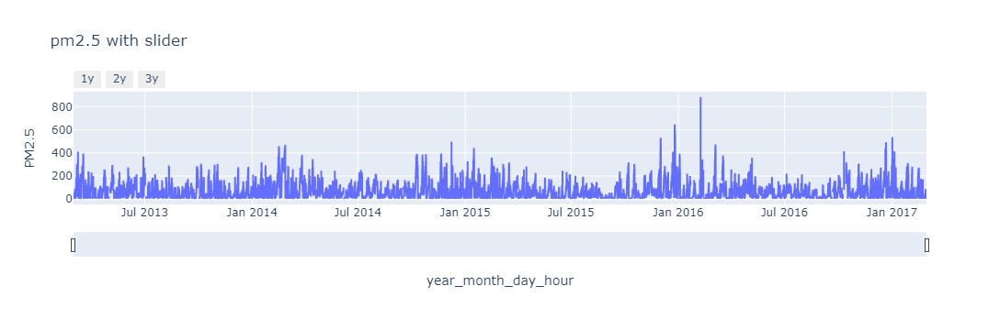

In [60]:
import plotly.express as px

fig = px.line(aq_df_non_indexed, x = 'year_month_day_hour',y = 'PM2.5', title = 'pm2.5 with slider')



fig.update_xaxes(
    rangeslider_visible = True,
    rangeselector = dict(
        buttons = list([
          dict(count = 1 , label = '1y', step ='year', stepmode = 'backward'),
          dict(count = 2 , label = '2y', step ='year', stepmode = 'backward'),
          dict(count = 3 , label = '3y', step ='year', stepmode = 'backward'),
        ])
    )
)
# can examine missing values


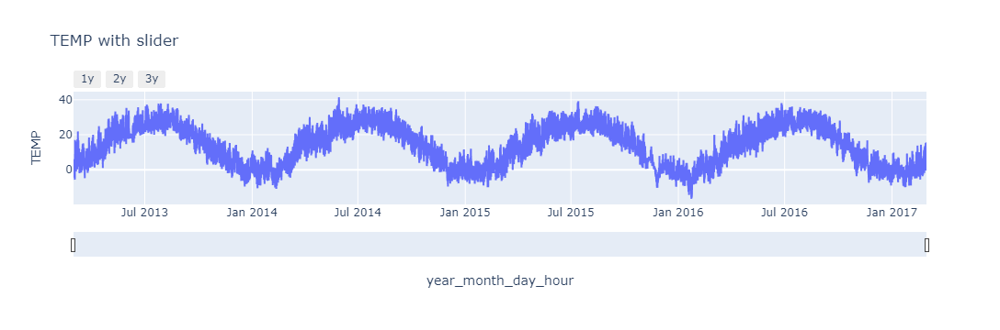

In [61]:
import plotly.express as px

fig = px.line(aq_df_non_indexed, x = 'year_month_day_hour',y = 'TEMP', title = 'TEMP with slider')



fig.update_xaxes(
    rangeslider_visible = True,
    rangeselector = dict(
        buttons = list([
          dict(count = 1 , label = '1y', step ='year', stepmode = 'backward'),
          dict(count = 2 , label = '2y', step ='year', stepmode = 'backward'),
          dict(count = 3 , label = '3y', step ='year', stepmode = 'backward'),
        ])
    )
)
# can examine missing values


In [62]:
#breaks in the data are missing vlaues

In [63]:
# around jan 2015 lot of missing values

In [64]:
## creating index helps to query the data 
aq_df = aq_df.set_index("year_month_day_hour")

In [65]:
aq_df_na = aq_df.copy()
aq_df_na = aq_df_na.dropna()

<Axes: xlabel='Lag', ylabel='Autocorrelation'>

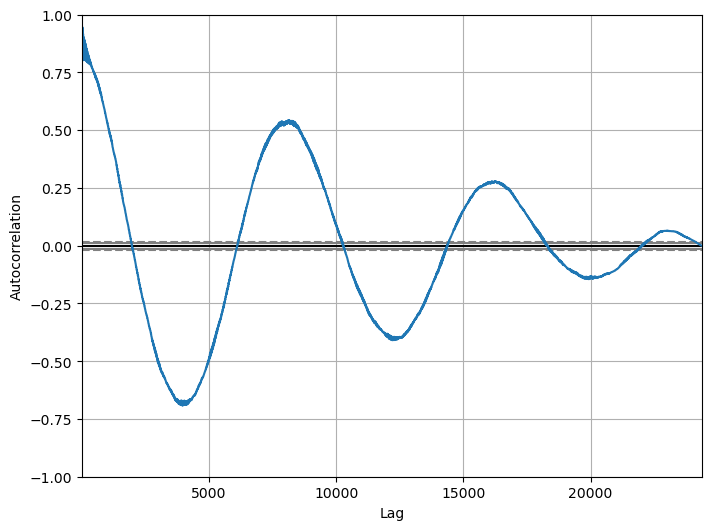

In [66]:

pd.plotting.autocorrelation_plot(aq_df_na['2014':'2016']['TEMP'])

In [67]:

aq_df_na['TEMP'].resample('1m').mean()

C:\Users\thaku\AppData\Local\Temp\ipykernel_35832\22743716.py:1: FutureWarning:

'm' is deprecated and will be removed in a future version, please use 'ME' instead.



year_month_day_hour
2013-03-31     6.039970
2013-04-30    12.208494
2013-05-31    21.886386
2013-06-30    23.752827
2013-07-31    27.405079
2013-08-31    27.228465
2013-09-30    20.482500
2013-10-31          NaN
2013-11-30     5.434524
2013-12-31     0.896623
2014-01-31     0.023428
2014-02-28    -0.352762
2014-03-31    10.415449
2014-04-30    17.235362
2014-05-31    22.043236
2014-06-30    25.194985
2014-07-31    28.409502
2014-08-31    26.284552
2014-09-30    20.834161
2014-10-31    13.556000
2014-11-30     6.357762
2014-12-31    -0.745582
2015-01-31    -0.590377
2015-02-28     1.572512
2015-03-31     8.707613
2015-04-30    15.566570
2015-05-31    21.300275
2015-06-30    24.636691
2015-07-31    26.228630
2015-08-31    26.135854
2015-09-30    20.392206
2015-10-31    14.387465
2015-11-30     3.358686
2015-12-31    -0.053912
2016-01-31    -4.233428
2016-02-29     1.434441
2016-03-31     8.687006
2016-04-30    16.262014
2016-05-31    20.793142
2016-06-30    25.481977
2016-07-31    25.839

C:\Users\thaku\AppData\Local\Temp\ipykernel_35832\1623201154.py:1: FutureWarning:

'm' is deprecated and will be removed in a future version, please use 'ME' instead.



<Axes: xlabel='Lag', ylabel='Autocorrelation'>

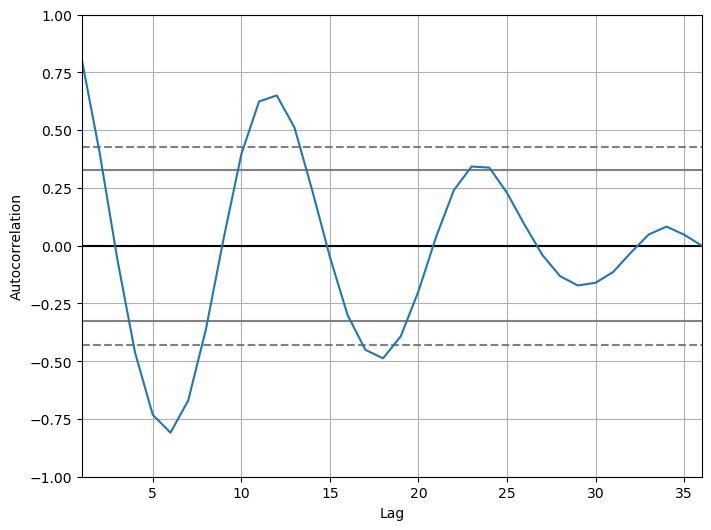

In [68]:
pd.plotting.autocorrelation_plot(aq_df_na['2014':'2016']['TEMP'].resample('1m').mean())
     

C:\Users\thaku\AppData\Local\Temp\ipykernel_35832\1844888425.py:1: FutureWarning:

'm' is deprecated and will be removed in a future version, please use 'ME' instead.



<Axes: xlabel='Lag', ylabel='Autocorrelation'>

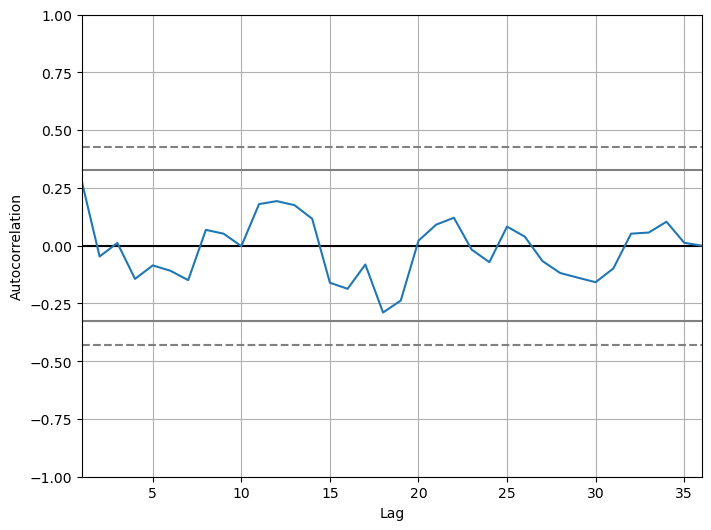

In [69]:

pd.plotting.autocorrelation_plot(aq_df_na['2014':'2016']['PM2.5'].resample('1m').mean())
     

In [70]:
# lave 1, lag 3 lage 24 have high similarity
# imputate with previous year data, previous hour data, avg of last 3 hours

In [71]:
## take the sample data where we ned to impute

In [72]:
aq_df['2015-02-21 10':'2015-02-21 20']

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
year_month_day_hour,,,,,,,,,,,,,,,,,,
2015-02-21 10:00:00,17339,2015,2,21,10,171.0,171.0,16.0,48.0,2400.0,6.0,1.0,1005.0,-1.1,0.0,SW,1.1,Dingling
2015-02-21 11:00:00,17340,2015,2,21,11,172.0,172.0,16.0,45.0,2200.0,13.0,1.0,1006.0,-0.9,0.0,SSW,1.2,Dingling
2015-02-21 12:00:00,17341,2015,2,21,12,164.0,164.0,16.0,46.0,2100.0,14.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
2015-02-21 13:00:00,17342,2015,2,21,13,175.0,175.0,16.0,46.0,2200.0,15.0,2.0,1006.0,-0.3,0.0,SW,1.6,Dingling
2015-02-21 14:00:00,17343,2015,2,21,14,207.0,207.0,16.0,46.0,2300.0,17.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
2015-02-21 15:00:00,17344,2015,2,21,15,231.0,231.0,18.0,40.0,2200.0,32.0,4.0,1004.0,-8.7,0.0,W,9.6,Dingling
2015-02-21 16:00:00,17345,2015,2,21,16,3.0,114.0,7.0,5.0,1100.0,88.0,4.0,1005.0,-12.5,0.0,NW,9.0,Dingling
2015-02-21 17:00:00,17346,2015,2,21,17,24.0,227.0,2.0,3.0,1800.0,91.0,3.0,1009.0,-16.7,0.0,WNW,6.4,Dingling
2015-02-21 18:00:00,17347,2015,2,21,18,40.0,351.0,2.0,2.0,1800.0,97.0,2.0,1010.0,-21.3,0.0,NW,7.3,Dingling


In [73]:
# in temp we have 3 missing values

In [74]:
aq_df_imp = aq_df['2015-02-21 10':'2015-02-21 20']

In [75]:
aq_df_imp

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
year_month_day_hour,,,,,,,,,,,,,,,,,,
2015-02-21 10:00:00,17339,2015,2,21,10,171.0,171.0,16.0,48.0,2400.0,6.0,1.0,1005.0,-1.1,0.0,SW,1.1,Dingling
2015-02-21 11:00:00,17340,2015,2,21,11,172.0,172.0,16.0,45.0,2200.0,13.0,1.0,1006.0,-0.9,0.0,SSW,1.2,Dingling
2015-02-21 12:00:00,17341,2015,2,21,12,164.0,164.0,16.0,46.0,2100.0,14.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
2015-02-21 13:00:00,17342,2015,2,21,13,175.0,175.0,16.0,46.0,2200.0,15.0,2.0,1006.0,-0.3,0.0,SW,1.6,Dingling
2015-02-21 14:00:00,17343,2015,2,21,14,207.0,207.0,16.0,46.0,2300.0,17.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
2015-02-21 15:00:00,17344,2015,2,21,15,231.0,231.0,18.0,40.0,2200.0,32.0,4.0,1004.0,-8.7,0.0,W,9.6,Dingling
2015-02-21 16:00:00,17345,2015,2,21,16,3.0,114.0,7.0,5.0,1100.0,88.0,4.0,1005.0,-12.5,0.0,NW,9.0,Dingling
2015-02-21 17:00:00,17346,2015,2,21,17,24.0,227.0,2.0,3.0,1800.0,91.0,3.0,1009.0,-16.7,0.0,WNW,6.4,Dingling
2015-02-21 18:00:00,17347,2015,2,21,18,40.0,351.0,2.0,2.0,1800.0,97.0,2.0,1010.0,-21.3,0.0,NW,7.3,Dingling


In [76]:
## we checked taht preivious hour temp has a good linearlity so fill with that
## ffil fills the data with previous time  value

In [77]:
aq_df_imp['TEMP_FFILL'] = aq_df_imp['TEMP'].fillna(method = 'ffill')

C:\Users\thaku\AppData\Local\Temp\ipykernel_35832\635202384.py:1: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

C:\Users\thaku\AppData\Local\Temp\ipykernel_35832\635202384.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [78]:
aq_df_imp
# takes previous value and fills that

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station,TEMP_FFILL
year_month_day_hour,,,,,,,,,,,,,,,,,,,
2015-02-21 10:00:00,17339,2015,2,21,10,171.0,171.0,16.0,48.0,2400.0,6.0,1.0,1005.0,-1.1,0.0,SW,1.1,Dingling,1.0
2015-02-21 11:00:00,17340,2015,2,21,11,172.0,172.0,16.0,45.0,2200.0,13.0,1.0,1006.0,-0.9,0.0,SSW,1.2,Dingling,1.0
2015-02-21 12:00:00,17341,2015,2,21,12,164.0,164.0,16.0,46.0,2100.0,14.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling,1.0
2015-02-21 13:00:00,17342,2015,2,21,13,175.0,175.0,16.0,46.0,2200.0,15.0,2.0,1006.0,-0.3,0.0,SW,1.6,Dingling,2.0
2015-02-21 14:00:00,17343,2015,2,21,14,207.0,207.0,16.0,46.0,2300.0,17.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling,2.0
2015-02-21 15:00:00,17344,2015,2,21,15,231.0,231.0,18.0,40.0,2200.0,32.0,4.0,1004.0,-8.7,0.0,W,9.6,Dingling,4.0
2015-02-21 16:00:00,17345,2015,2,21,16,3.0,114.0,7.0,5.0,1100.0,88.0,4.0,1005.0,-12.5,0.0,NW,9.0,Dingling,4.0
2015-02-21 17:00:00,17346,2015,2,21,17,24.0,227.0,2.0,3.0,1800.0,91.0,3.0,1009.0,-16.7,0.0,WNW,6.4,Dingling,3.0
2015-02-21 18:00:00,17347,2015,2,21,18,40.0,351.0,2.0,2.0,1800.0,97.0,2.0,1010.0,-21.3,0.0,NW,7.3,Dingling,2.0


In [79]:
### backward fill take the next value and fills it in previous line
# not that mucch applicable since we would be predicting future in general 

In [80]:
## not much app of backward fill
aq_df_imp['TEMP_BFILL'] = aq_df_imp['TEMP'].fillna(method = 'bfill')

C:\Users\thaku\AppData\Local\Temp\ipykernel_35832\3901047854.py:2: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

C:\Users\thaku\AppData\Local\Temp\ipykernel_35832\3901047854.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [81]:
aq_df_imp

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station,TEMP_FFILL,TEMP_BFILL
year_month_day_hour,,,,,,,,,,,,,,,,,,,,
2015-02-21 10:00:00,17339,2015,2,21,10,171.0,171.0,16.0,48.0,2400.0,6.0,1.0,1005.0,-1.1,0.0,SW,1.1,Dingling,1.0,1.0
2015-02-21 11:00:00,17340,2015,2,21,11,172.0,172.0,16.0,45.0,2200.0,13.0,1.0,1006.0,-0.9,0.0,SSW,1.2,Dingling,1.0,1.0
2015-02-21 12:00:00,17341,2015,2,21,12,164.0,164.0,16.0,46.0,2100.0,14.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling,1.0,2.0
2015-02-21 13:00:00,17342,2015,2,21,13,175.0,175.0,16.0,46.0,2200.0,15.0,2.0,1006.0,-0.3,0.0,SW,1.6,Dingling,2.0,2.0
2015-02-21 14:00:00,17343,2015,2,21,14,207.0,207.0,16.0,46.0,2300.0,17.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling,2.0,4.0
2015-02-21 15:00:00,17344,2015,2,21,15,231.0,231.0,18.0,40.0,2200.0,32.0,4.0,1004.0,-8.7,0.0,W,9.6,Dingling,4.0,4.0
2015-02-21 16:00:00,17345,2015,2,21,16,3.0,114.0,7.0,5.0,1100.0,88.0,4.0,1005.0,-12.5,0.0,NW,9.0,Dingling,4.0,4.0
2015-02-21 17:00:00,17346,2015,2,21,17,24.0,227.0,2.0,3.0,1800.0,91.0,3.0,1009.0,-16.7,0.0,WNW,6.4,Dingling,3.0,3.0
2015-02-21 18:00:00,17347,2015,2,21,18,40.0,351.0,2.0,2.0,1800.0,97.0,2.0,1010.0,-21.3,0.0,NW,7.3,Dingling,2.0,2.0


In [85]:
### we can take mean of some previous hours values also 
## since in some countries temp can change very sharly 
# dont wana assume 
## window suggests that we would be taking this much periods and 
## min would suggest if values like example 3 is taken as window then if min is 1 then if only 1 value is present take that 
aq_df_imp['TMP_ROLLING'] = aq_df_imp['TEMP'].fillna(0).rolling(window = 2, min_periods =1 ).mean()

# fillna required to cal properly

C:\Users\thaku\AppData\Local\Temp\ipykernel_35832\1633462474.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [86]:
aq_df_imp.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,...,TEMP,PRES,DEWP,RAIN,wd,WSPM,station,TEMP_FFILL,TEMP_BFILL,TMP_ROLLING
year_month_day_hour,,,,,,,,,,,,,,,,,,,,,
2015-02-21 10:00:00,17339,2015,2,21,10,171.0,171.0,16.0,48.0,2400.0,...,1.0,1005.0,-1.1,0.0,SW,1.1,Dingling,1.0,1.0,1.0
2015-02-21 11:00:00,17340,2015,2,21,11,172.0,172.0,16.0,45.0,2200.0,...,1.0,1006.0,-0.9,0.0,SSW,1.2,Dingling,1.0,1.0,1.0
2015-02-21 12:00:00,17341,2015,2,21,12,164.0,164.0,16.0,46.0,2100.0,...,NaN,NaN,NaN,NaN,NaN,NaN,Dingling,1.0,2.0,0.5
2015-02-21 13:00:00,17342,2015,2,21,13,175.0,175.0,16.0,46.0,2200.0,...,2.0,1006.0,-0.3,0.0,SW,1.6,Dingling,2.0,2.0,1.0
2015-02-21 14:00:00,17343,2015,2,21,14,207.0,207.0,16.0,46.0,2300.0,...,NaN,NaN,NaN,NaN,NaN,NaN,Dingling,2.0,4.0,1.0


In [87]:
# can also take corrs. prev year value but maynot be true global warming / delay in seasons
# ex in walmart to fillna in a weekend sale we nned to use the previous weekend only 

In [ ]:
## filling iwth prev year data
## getting data corr to previous year from current year


In [88]:
aq_df.loc[aq_df_imp.index + pd.offsets.DateOffset(years = -1)]['TEMP']

year_month_day_hour
2014-02-21 10:00:00    1.4
2014-02-21 11:00:00    2.4
2014-02-21 12:00:00    3.0
2014-02-21 13:00:00    3.8
2014-02-21 14:00:00    3.5
2014-02-21 15:00:00    3.6
2014-02-21 16:00:00    3.3
2014-02-21 17:00:00    2.8
2014-02-21 18:00:00    1.3
2014-02-21 19:00:00    0.7
2014-02-21 20:00:00    1.2
Name: TEMP, dtype: float64

In [96]:
# TO UPDATE WE need to add datetime as a col instead of index
aq_df_imp  = aq_df_imp.reset_index()

In [97]:
aq_df_imp

,year_month_day_hour,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,...,TEMP,PRES,DEWP,RAIN,wd,WSPM,station,TEMP_FFILL,TEMP_BFILL,TMP_ROLLING
0,2015-02-21 10:00:00,17339,2015,2,21,10,171.0,171.0,16.0,48.0,...,1.0,1005.0,-1.1,0.0,SW,1.1,Dingling,1.0,1.0,1.0
1,2015-02-21 11:00:00,17340,2015,2,21,11,172.0,172.0,16.0,45.0,...,1.0,1006.0,-0.9,0.0,SSW,1.2,Dingling,1.0,1.0,1.0
2,2015-02-21 12:00:00,17341,2015,2,21,12,164.0,164.0,16.0,46.0,...,NaN,NaN,NaN,NaN,NaN,NaN,Dingling,1.0,2.0,0.5
3,2015-02-21 13:00:00,17342,2015,2,21,13,175.0,175.0,16.0,46.0,...,2.0,1006.0,-0.3,0.0,SW,1.6,Dingling,2.0,2.0,1.0
4,2015-02-21 14:00:00,17343,2015,2,21,14,207.0,207.0,16.0,46.0,...,NaN,NaN,NaN,NaN,NaN,NaN,Dingling,2.0,4.0,1.0
5,2015-02-21 15:00:00,17344,2015,2,21,15,231.0,231.0,18.0,40.0,...,4.0,1004.0,-8.7,0.0,W,9.6,Dingling,4.0,4.0,2.0
6,2015-02-21 16:00:00,17345,2015,2,21,16,3.0,114.0,7.0,5.0,...,4.0,1005.0,-12.5,0.0,NW,9.0,Dingling,4.0,4.0,4.0
7,2015-02-21 17:00:00,17346,2015,2,21,17,24.0,227.0,2.0,3.0,...,3.0,1009.0,-16.7,0.0,WNW,6.4,Dingling,3.0,3.0,3.5
8,2015-02-21 18:00:00,17347,2015,2,21,18,40.0,351.0,2.0,2.0,...,2.0,1010.0,-21.3,0.0,NW,7.3,Dingling,2.0,2.0,2.5
9,2015-02-21 19:00:00,17348,2015,2,21,19,35.0,410.0,2.0,2.0,...,1.0,1011.0,-20.7,0.0,NW,5.7,Dingling,1.0,1.0,1.5


In [98]:

aq_df_imp['TEMP_PREVY'] = aq_df_imp.apply(lambda x: aq_df.loc[x['year_month_day_hour'] - pd.offsets.DateOffset(years = -1)]['TEMP'] if pd.isna(x['TEMP']) else x['TEMP'],axis = 1)

In [99]:
aq_df_imp

,year_month_day_hour,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,...,PRES,DEWP,RAIN,wd,WSPM,station,TEMP_FFILL,TEMP_BFILL,TMP_ROLLING,TEMP_PREVY
0,2015-02-21 10:00:00,17339,2015,2,21,10,171.0,171.0,16.0,48.0,...,1005.0,-1.1,0.0,SW,1.1,Dingling,1.0,1.0,1.0,1.0
1,2015-02-21 11:00:00,17340,2015,2,21,11,172.0,172.0,16.0,45.0,...,1006.0,-0.9,0.0,SSW,1.2,Dingling,1.0,1.0,1.0,1.0
2,2015-02-21 12:00:00,17341,2015,2,21,12,164.0,164.0,16.0,46.0,...,NaN,NaN,NaN,NaN,NaN,Dingling,1.0,2.0,0.5,1.9
3,2015-02-21 13:00:00,17342,2015,2,21,13,175.0,175.0,16.0,46.0,...,1006.0,-0.3,0.0,SW,1.6,Dingling,2.0,2.0,1.0,2.0
4,2015-02-21 14:00:00,17343,2015,2,21,14,207.0,207.0,16.0,46.0,...,NaN,NaN,NaN,NaN,NaN,Dingling,2.0,4.0,1.0,4.9
5,2015-02-21 15:00:00,17344,2015,2,21,15,231.0,231.0,18.0,40.0,...,1004.0,-8.7,0.0,W,9.6,Dingling,4.0,4.0,2.0,4.0
6,2015-02-21 16:00:00,17345,2015,2,21,16,3.0,114.0,7.0,5.0,...,1005.0,-12.5,0.0,NW,9.0,Dingling,4.0,4.0,4.0,4.0
7,2015-02-21 17:00:00,17346,2015,2,21,17,24.0,227.0,2.0,3.0,...,1009.0,-16.7,0.0,WNW,6.4,Dingling,3.0,3.0,3.5,3.0
8,2015-02-21 18:00:00,17347,2015,2,21,18,40.0,351.0,2.0,2.0,...,1010.0,-21.3,0.0,NW,7.3,Dingling,2.0,2.0,2.5,2.0
9,2015-02-21 19:00:00,17348,2015,2,21,19,35.0,410.0,2.0,2.0,...,1011.0,-20.7,0.0,NW,5.7,Dingling,1.0,1.0,1.5,1.0
